In [2]:
# !pip install geopandas
# !pip install folium matplotlib mapclassify

## Our Dataset
> Thanks to our Mentors for Posting this

In [2]:
#Read File from shapefile
import geopandas as gpd
import matplotlib.pyplot as plt
import zipfile
import json

file_path = r'Data\Hackathon\buildings.zip'
file_name = 'buildings.shp'
with zipfile.ZipFile(file_path, 'r') as zip_ref:
    zip_ref.extractall()

# Read JSON data into GeoDataFrame

gdf2 = gpd.read_file(file_name)

# Plot the GeoDataFrame
gdf2.explore()

# Looking at Our Dataset

In [4]:
import geopandas as gpd
from sklearn.cluster import KMeans
import numpy as np
from shapely.geometry import Point

# Step 1: Read Shapefile and Display Basic Info
file_path = r'D:\projects\Events\2023 CM Codeware Hackathon\Data\Hackathon\buildings.zip'
file_name = 'buildings.shp'

# Extract shapefile from the zip archive
with zipfile.ZipFile(file_path, 'r') as zip_ref:
    zip_ref.extractall()

# Read shapefile into a GeoDataFrame
gdf = gpd.read_file(file_name)

# Display basic information about the GeoDataFrame
print("Basic Info about the GeoDataFrame:")
print(gdf.info())
print("\nPreview of the GeoDataFrame:")
print(gdf.head())



Basic Info about the GeoDataFrame:
<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 2578 entries, 0 to 2577
Data columns (total 68 columns):
 #   Column      Non-Null Count  Dtype   
---  ------      --------------  -----   
 0   full_id     2578 non-null   object  
 1   osm_id      2578 non-null   object  
 2   osm_type    2578 non-null   object  
 3   building    2578 non-null   object  
 4   garden_typ  1 non-null      object  
 5   material    1 non-null      object  
 6   solar_pane  7 non-null      object  
 7   watertank   10 non-null     object  
 8   temple      1 non-null      object  
 9   leisure     2 non-null      object  
 10  building_m  30 non-null     object  
 11  place_of_w  4 non-null      object  
 12  website     1 non-null      object  
 13  office      1 non-null      object  
 14  government  1 non-null      object  
 15  designatio  1 non-null      object  
 16  addr_provi  1 non-null      object  
 17  addr_distr  1 non-null      object  
 18  healt

# Adaptive Grid Formation

C:\Users\jasw.LAPTOP-SR8QA6EL\AppData\Local\Temp\ipykernel_8208\1370872441.py:11: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  gdf['centroid'] = gdf['geometry'].centroid


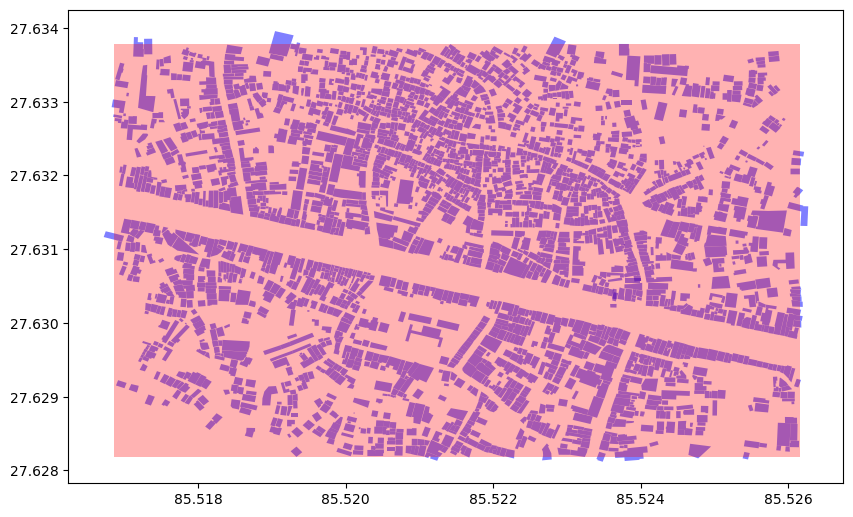

In [5]:
import geopandas as gpd
import numpy as np
from sklearn.cluster import DBSCAN
from shapely.geometry import Point
from shapely.geometry import Polygon

# Read shapefile into a GeoDataFrame
gdf = gpd.read_file(file_name)

# Step 2: Calculate Building Centers
gdf['centroid'] = gdf['geometry'].centroid

# Extract coordinates and convert to a NumPy array
building_centroids = np.array(gdf['centroid'].apply(lambda point: (point.x, point.y)).tolist())


# Step 3: Clustering
epsilon = 0.01  # Adjust as needed
min_samples = 5  # Adjust as needed
dbscan = DBSCAN(eps=epsilon, min_samples=min_samples, metric='euclidean')
gdf['cluster'] = dbscan.fit_predict(building_centroids)

# Step 4: Calculate Cluster Densities
cluster_densities = gdf['cluster'].value_counts()

# Step 5 and 6: Adaptive Grid Creation and Visualization
# Create a new GeoDataFrame for the adaptive grid
grid_cells = []

for cluster_id, density in cluster_densities.items():
    # Determine grid cell size based on density
    cell_size = 0.001 / np.sqrt(density)  # Adjust the factor as needed
    
    # Generate grid polygons based on centroids and cell size
    cluster_buildings = gdf[gdf['cluster'] == cluster_id]
    min_x, min_y, max_x, max_y = cluster_buildings['centroid'].total_bounds
    rows = int((max_y - min_y) / cell_size)
    cols = int((max_x - min_x) / cell_size)
    
    for i in range(rows):
        for j in range(cols):
            left = min_x + j * cell_size
            right = left + cell_size
            bottom = min_y + i * cell_size
            top = bottom + cell_size
            grid_geometry = Polygon([
                (left, bottom), (right, bottom),
                (right, top), (left, top)
            ])
            # Calculate the row and column labels based on i and j
            row_label = chr(ord('A') + i)  # Convert index to letter (A, B, C, ...)
            col_label = j + 1  # Add 1 to make it 1-based index
            
            # Create a label for the grid (e.g., A1, B2, C3, ...)
            grid_label = f"{row_label}{col_label}"
            
            grid_cells.append({
                'cluster_id': cluster_id,
                'grid_geometry': grid_geometry,
                'grid_label': grid_label  # Add the label to the dictionary
            })

# Create a new GeoDataFrame for the grid cells
grid_gdf = gpd.GeoDataFrame(grid_cells, geometry='grid_geometry')

# Visualization (you can customize this as needed)
import matplotlib.pyplot as plt

fig, ax = plt.subplots(figsize=(10, 10))
gdf.plot(ax=ax, color='blue', alpha=0.5, markersize=10)
grid_gdf.plot(ax=ax, color='red', alpha=0.3)
plt.show()

# No of Lines 

In [6]:
# Calculate the number of vertical and horizontal lines
num_vertical_lines = cols + 1
num_horizontal_lines = rows + 1

print("Number of vertical lines:", num_vertical_lines)
print("Number of horizontal lines:", num_horizontal_lines)



Number of vertical lines: 473
Number of horizontal lines: 285


# Getting Intersecting Grids for Each Building

In [7]:
# Import required libraries
import geopandas as gpd
from shapely.geometry import Point

# Read the building data
gdf = gpd.read_file(file_name)

# Create spatial index for grid GeoDataFrame
grid_gdf_sindex = grid_gdf.sindex

# Create a new column in the building GeoDataFrame to store covered grids and areas
gdf['covered_grids'] = None

# Iterate through each building and calculate covered grids and areas
for idx, building in gdf.iterrows():
    building_geometry = building['geometry']
    
    # Get the indices of potentially intersecting grids
    possible_matches_index = list(grid_gdf_sindex.intersection(building_geometry.bounds))
    
    # Initialize a list to store covered grids and areas
    covered_grids = []
    
    # Iterate through potential matches to find actual intersections
    for grid_index in possible_matches_index:
        grid_geometry = grid_gdf.loc[grid_index, 'grid_geometry']
        
        if building_geometry.intersects(grid_geometry):
            intersection = building_geometry.intersection(grid_geometry)
            covered_area = intersection.area
            covered_grids.append((grid_index, covered_area))
    
    # Store the covered grids and areas for the current building
    gdf.at[idx, 'covered_grids'] = covered_grids

# Print the covered grids and areas for each building
for idx, building in gdf.iterrows():
    print(f"Building {idx} covers the following grids:")
    for grid_index, covered_area in building['covered_grids']:
        grid_label = grid_gdf.loc[grid_index, 'grid_label']
        print(f"Grid {grid_label}: Covered Area = {covered_area:.2f}")


Building 0 covers the following grids:
Grid Ħ149: Covered Area = 0.00
Grid Ħ148: Covered Area = 0.00
Grid ħ146: Covered Area = 0.00
Grid ħ147: Covered Area = 0.00
Grid Ĩ146: Covered Area = 0.00
Grid ħ149: Covered Area = 0.00
Grid ħ150: Covered Area = 0.00
Grid ħ148: Covered Area = 0.00
Grid Ĩ147: Covered Area = 0.00
Grid Ĩ150: Covered Area = 0.00
Grid Ĩ148: Covered Area = 0.00
Grid Ĩ149: Covered Area = 0.00
Grid ĩ149: Covered Area = 0.00
Grid ĩ148: Covered Area = 0.00
Grid Ĭ151: Covered Area = 0.00
Grid ĭ152: Covered Area = 0.00
Grid Į152: Covered Area = 0.00
Grid ĩ150: Covered Area = 0.00
Grid Ī150: Covered Area = 0.00
Grid Ī147: Covered Area = 0.00
Grid Ī149: Covered Area = 0.00
Grid Ī148: Covered Area = 0.00
Grid Ī151: Covered Area = 0.00
Grid ī147: Covered Area = 0.00
Grid ī149: Covered Area = 0.00
Grid ī150: Covered Area = 0.00
Grid ī148: Covered Area = 0.00
Grid ĩ146: Covered Area = 0.00
Grid ĩ147: Covered Area = 0.00
Grid Ī146: Covered Area = 0.00
Grid ī151: Covered Area = 0.00


# Setting The Address

In [8]:
# Define a function to generate hierarchical addresses
def generate_address(grid_labels, building_number):
    letters = [ord(i[:1])-ord('A') for i in grid_labels]
    numbers = [int(i[1:]) for i in grid_labels]
    minL,maxL = chr(ord('A') + min(letters)),chr(ord('A') + max(letters))
    minN,maxN = str(min(numbers)),str(max(numbers))

    return f"{minL}{maxL}-{minN}/{maxN}"  # Adjust the padding as needed
    # return f"{grid_label}-{building_number:04d}"  # Adjust the padding as needed

# Iterate through each building to assign addresses
for idx, building in gdf.iterrows():
    covered_grid_indices = [grid_info[0] for grid_info in building['covered_grids']]
    grid_labels = [grid_gdf.loc[grid_index, 'grid_label'] for grid_index in covered_grid_indices]
    address = generate_address(grid_labels, idx + 1)  # +1 to start with building number 1
    gdf.at[idx, 'address'] = address

# Print the addresses for each building
for idx, building in gdf.iterrows():
    print(f"Building {idx} has the address: {building['address']}")


Building 0 has the address: Ħį-146/152
Building 1 has the address: įĲ-94/97
Building 2 has the address: ęģ-111/120
Building 3 has the address: ġĩ-122/129
Building 4 has the address: ıķ-92/96
Building 5 has the address: Ĕğ-165/172
Building 6 has the address: čĐ-66/71
Building 7 has the address: ĞĢ-167/177
Building 8 has the address: ĖĜ-130/137
Building 9 has the address: āĈ-12/16
Building 10 has the address: Þæ-192/212
Building 11 has the address: ÈÌ-384/391
Building 12 has the address: ÌÒ-232/238
Building 13 has the address: ÈÍ-397/401
Building 14 has the address: ¬±-390/397
Building 15 has the address: ×â-381/390
Building 16 has the address: ÆÐ-234/242
Building 17 has the address: Úá-395/403
Building 18 has the address: ÑÚ-388/396
Building 19 has the address: Ùà-409/423
Building 20 has the address: ËÖ-209/221
Building 21 has the address: ùÿ-326/331
Building 22 has the address: úÿ-286/294
Building 23 has the address: ÷ú-265/271
Building 24 has the address: ×Ü-333/340
Building 25 has th

# Result

In [9]:
import geopandas as gpd
import folium
from folium import GeoJson
import json

# Read the GeoDataFrame from the shapefile

# Convert potentially problematic columns to Python types
gdf['address'] = gdf['address'].astype(str)  # Convert address to string

# Convert int64 values to Python integers
gdf['covered_grids'] = gdf['covered_grids'].apply(lambda x: [(int(idx), float(area)) for idx, area in x])

# Create a custom tooltip function
def custom_tooltip(feature):
    return f"Address: {feature['properties']['address']}"

# Convert GeoDataFrame to GeoJSON
geojson_data = gdf.to_crs(epsg='4326').to_json()

# Create a Folium Map centered at the mean coordinates of the GeoDataFrame
m = folium.Map(location=[gdf.geometry.centroid.y.mean(), gdf.geometry.centroid.x.mean()], zoom_start=15)

# Add GeoJson layer with custom tooltip
GeoJson(
    geojson_data,
    style_function=lambda feature: {'color': 'blue'},
    highlight_function=lambda feature: {'color': 'red'},
    tooltip=folium.GeoJsonTooltip(fields=['address'], labels=True, sticky=False, localize=True),
).add_to(m)

# Display the map
m


C:\Users\jasw.LAPTOP-SR8QA6EL\AppData\Local\Temp\ipykernel_8208\1410196749.py:22: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  m = folium.Map(location=[gdf.geometry.centroid.y.mean(), gdf.geometry.centroid.x.mean()], zoom_start=15)
